In [1]:
# Run this cell to configure Tensorflow to use your GPU
import tensorflow as tf
for gpu in tf.config.experimental.list_physical_devices('GPU'):
    print(gpu)
    tf.config.experimental.set_memory_growth(gpu, True)

PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')
PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')


2023-07-01 16:37:58.335534: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-07-01 16:37:58.335750: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-07-01 16:37:58.353478: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-07-01 16:37:58.353702: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-07-01 16:37:58.353876: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from S

In [2]:
import tensorflow as tf
import tensorflow_hub as hub

# See https://tfhub.dev/ to find other models.
# Average inference time on 24 CPUs = 96 ms
module = 'https://tfhub.dev/tensorflow/ssd_mobilenet_v2/2'

detector = hub.load(module)

2023-07-01 16:37:58.794656: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-07-01 16:37:58.921867: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-07-01 16:37:58.922057: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-07-01 16:37:58.922221: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:936] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so retur

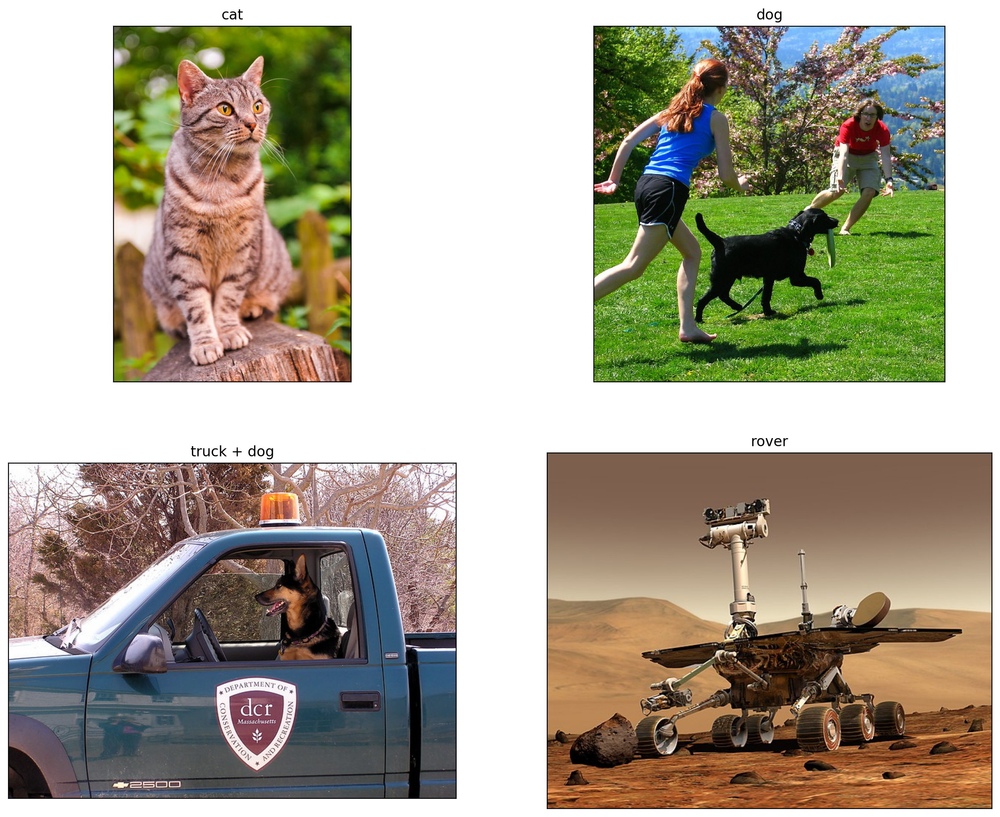

In [3]:
from utils.plot import *

# Loads a tiny batch of images from Internet
images_raw = load_tiny_batch()
plot_images_grid(images_raw)

In [4]:
import numpy as np
import pandas as pd

model_inputs = {name: np.expand_dims(np.array(image), 0) for name, image in images_raw.items()}

In [5]:
%%time

# Running a forward pass through the network with the input image.
model_outputs = {
    name: detector(image_input)
    for name, image_input in model_inputs.items()
}

2023-07-01 16:38:09.830870: I tensorflow/stream_executor/cuda/cuda_dnn.cc:368] Loaded cuDNN version 8800
2023-07-01 16:38:10.259530: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-07-01 16:38:10.260198: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-07-01 16:38:10.260207: W tensorflow/stream_executor/gpu/asm_compiler.cc:80] Couldn't get ptxas version string: INTERNAL: Couldn't invoke ptxas --version
2023-07-01 16:38:10.260658: I tensorflow/core/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-07-01 16:38:10.260697: W tensorflow/stream_executor/gpu/redzone_allocator.cc:314] INTERNAL: Failed to launch ptxas
Relying on driver to perform ptx compilation. 
Modify $PATH to customize ptxas location.
This message will be only logged once.


CPU times: user 3.07 s, sys: 453 ms, total: 3.52 s
Wall time: 3.25 s


In [6]:
# The result is a dictionary of tensors, so let's look at the shapes.
{name: r.shape for name, r in model_outputs['cat'].items()}

{'detection_anchor_indices': TensorShape([1, 100]),
 'detection_boxes': TensorShape([1, 100, 4]),
 'num_detections': TensorShape([1]),
 'detection_classes': TensorShape([1, 100]),
 'raw_detection_boxes': TensorShape([1, 1917, 4]),
 'detection_scores': TensorShape([1, 100]),
 'raw_detection_scores': TensorShape([1, 1917, 91]),
 'detection_multiclass_scores': TensorShape([1, 100, 91])}

In [7]:
# We need to load a mapping between integer class IDs and English labels.
# There is a helper function in utils folder to do just that.
# Note that integer IDs are in range [1, 90] but there are only 80 classes in MS COCO dataset.

from utils.mscoco import load_class_map
class_map = load_class_map()
class_map

,label
id,
1,person
2,bicycle
3,car
4,motorcycle
5,airplane
...,...
86,vase
87,scissors
88,teddy bear


In [8]:
# Now we can use the data frame from above to convert
# the model output (integer IDs) to the corresponding English labels.

def model_output_to_scores_df(model_output: dict) -> pd.DataFrame:
    class_ids = model_output['detection_classes'][0].numpy().astype(int)
    class_labels = class_map.loc[class_ids].reset_index(drop=True)
    class_scores = pd.Series(model_output['detection_scores'][0].numpy()).rename('score')

    class_predictions = pd.concat([class_labels, class_scores], axis=1)
    class_predictions = class_predictions.sort_values('score', ascending=False)
    
    return class_predictions

def plot_image_with_boxes(input_image: np.ndarray, model_output: dict):
    class_ids = model_output['detection_classes'][0].numpy().astype(int)
    class_labels = class_map.loc[class_ids].reset_index(drop=True)
    
    image_with_boxes = draw_boxes(
        np.array(input_image[0]), 
        model_output["detection_boxes"][0],
        class_labels.label.values,
        model_output["detection_scores"][0],
        min_score=0.50
    )
    plt.figure(figsize=[10, 10])
    plot_image(image_with_boxes)

,label,score
0,cat,0.843895
1,bench,0.238339
2,dog,0.228477
3,bench,0.211094
4,apple,0.210675


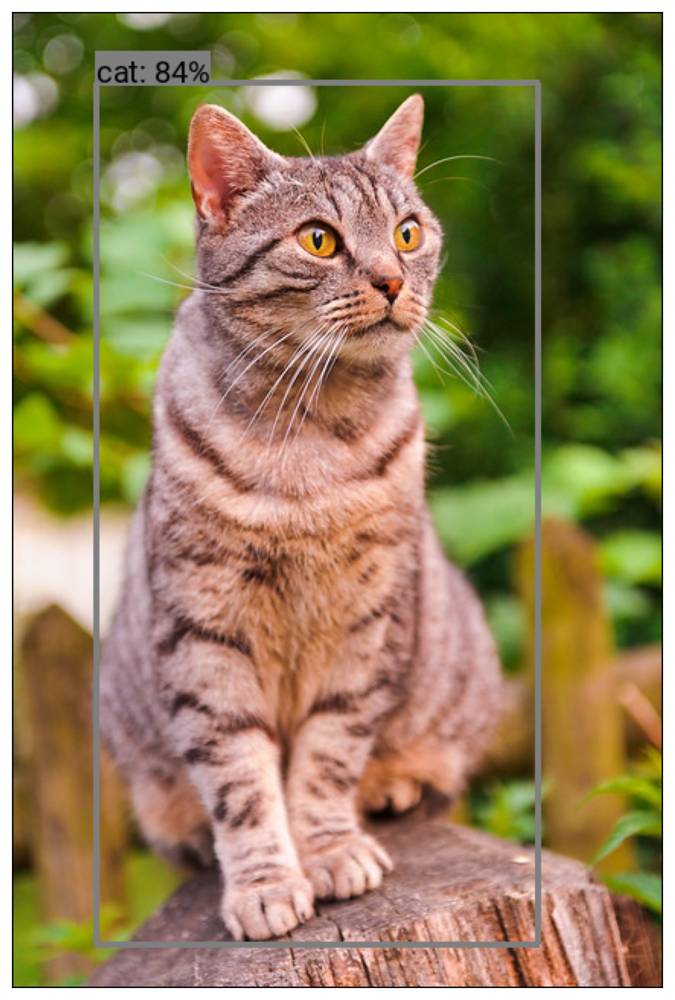

In [9]:
plot_image_with_boxes(model_inputs['cat'], model_outputs['cat'])
model_output_to_scores_df(model_outputs['cat']).head(5)

,label,score
0,dog,0.843381
1,person,0.825057
2,person,0.819973
3,frisbee,0.400816
4,bottle,0.281339


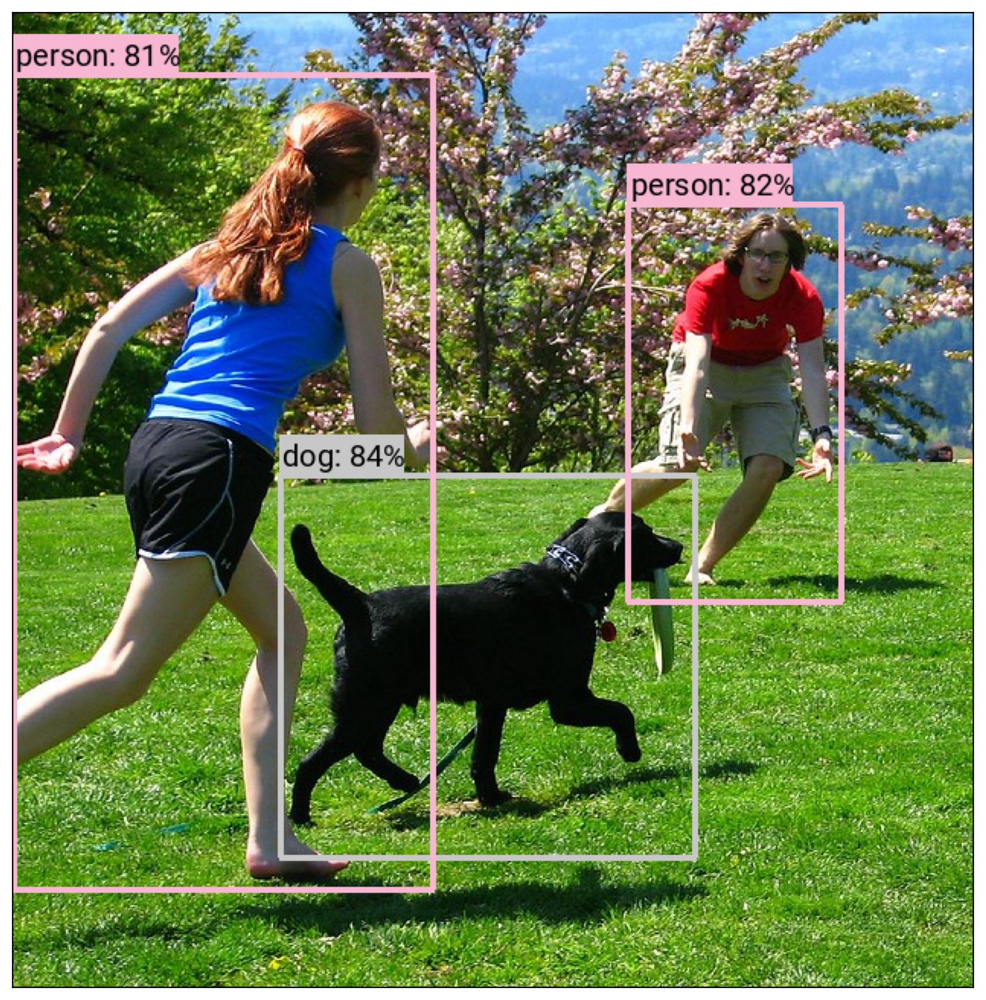

In [10]:
plot_image_with_boxes(model_inputs['dog'], model_outputs['dog'])
model_output_to_scores_df(model_outputs['dog']).head(5)

,label,score
0,car,0.587303
1,dog,0.576827
2,cat,0.444964
3,truck,0.427985
4,dog,0.410281


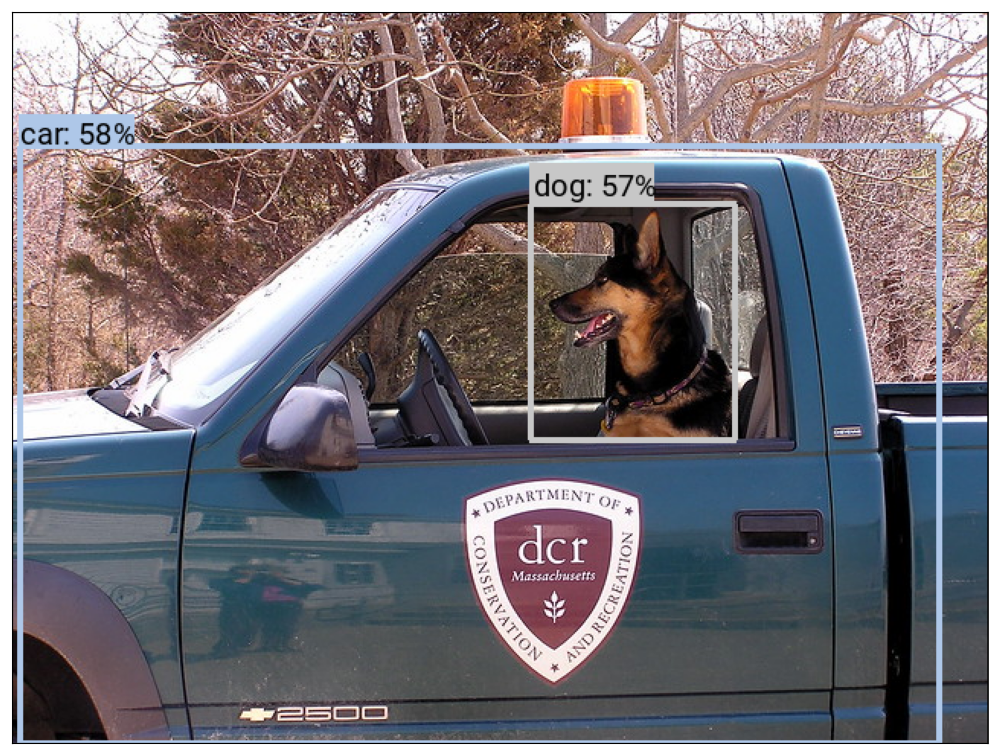

In [11]:
plot_image_with_boxes(model_inputs['truck + dog'], model_outputs['truck + dog'])
model_output_to_scores_df(model_outputs['truck + dog']).head(5)

,label,score
0,airplane,0.763364
1,truck,0.573887
2,truck,0.548243
3,truck,0.532484
4,person,0.485124


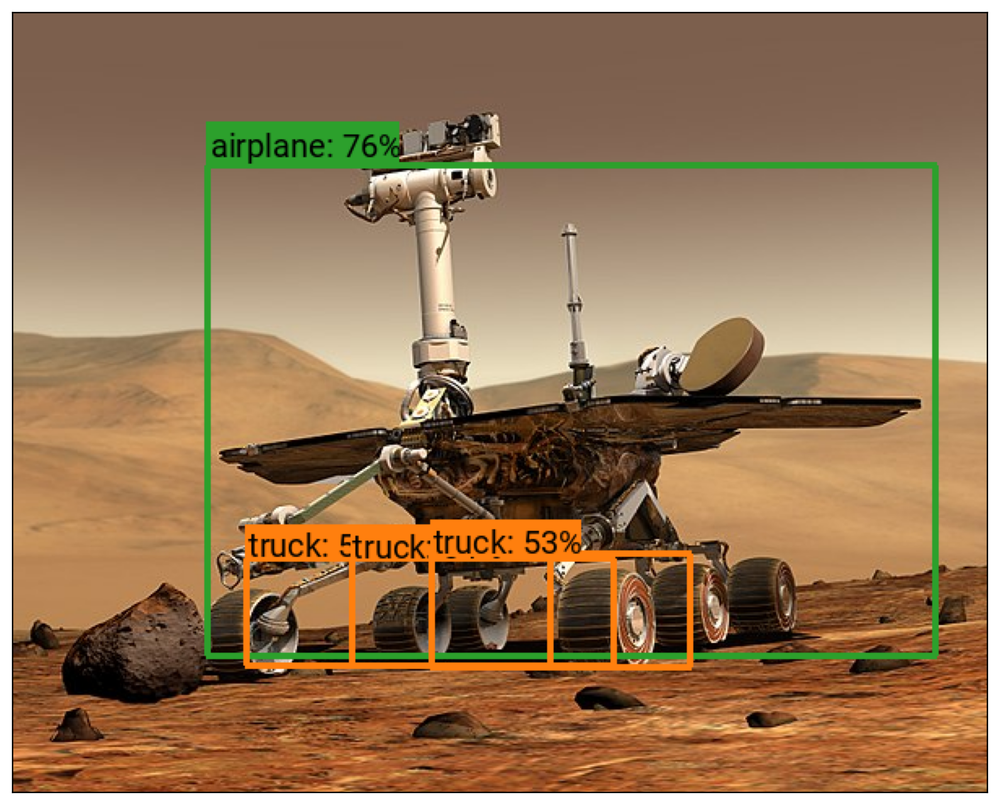

In [12]:
plot_image_with_boxes(model_inputs['rover'], model_outputs['rover'])
model_output_to_scores_df(model_outputs['rover']).head(5)